In [1]:
from pandas import ExcelFile
import geopandas as gpd
from pandas import read_csv
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from PaddockTS.Data.environmental import download_environmental_data
from PaddockTS.get_outputs import get_outputs
from PaddockTS.query import Query

2025-09-10 13:08:57.885298: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-10 13:09:01.114181: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-10 13:09:36.949053: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
xlsx = ExcelFile('/g/data/xe2/ya6227/NVTAnalysis/data/NVT.xlsx')
df = xlsx.parse('Canola')

In [3]:
def plot_experiments_across_australia(df: DataFrame):
    gdf = gpd.GeoDataFrame(
        df, 
        geometry=gpd.points_from_xy(
        df['Trial GPS Long'],
        df['Trial GPS Lat']),
        crs="EPSG:4326"
    )
    aus_states = gpd.read_file("/g/data/xe2/ya6227/NVTAnalysis/data/gadm41_AUS_1.shp")
    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    # Group by GPS + Region to get average yield per site
    gdf_grouped = (
        gdf_filtered.groupby(["Trial GPS Lat", "Trial GPS Long", "RegionName"])
        .agg({
            "Single Site Yield": "mean",
            "geometry": "first"
        })
        .reset_index()
    )
    
    # Convert back to GeoDataFrame
    gdf_grouped = gpd.GeoDataFrame(gdf_grouped, geometry="geometry", crs="EPSG:4326")
    
    # Normalize marker size
    min_size, max_size = 20, 200
    yield_min = gdf_grouped["Single Site Yield"].min()
    yield_max = gdf_grouped["Single Site Yield"].max()
    gdf_grouped["marker_size"] = gdf_grouped["Single Site Yield"].apply(
        lambda y: min_size + (y - yield_min) / (yield_max - yield_min) * (max_size - min_size)
    )
    
    
    unique_regions = gdf_grouped["RegionName"].unique()
    num_regions = len(unique_regions)
    colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"
    
    # Create region → color map using hex codes
    region_colors = {
        region: mcolors.to_hex(colormap(i)) for i, region in enumerate(unique_regions)
    }
    
    # Plot
    fig, ax = plt.subplots(figsize=(16, 16))
    aus_states.plot(ax=ax, color='white', edgecolor='black')
    
    for region, group in gdf_grouped.groupby("RegionName"):
        group.plot(
            ax=ax,
            color=region_colors[region],
            markersize=group["marker_size"],
            edgecolor="black",
            alpha=0.7,
            label=region
        )
    
    ax.set_title("NVT Trial Sites by Region with Yield-based Marker Size (2017–2024)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()
        

/g/data/xe2/ya6227/tmp/ipykernel_4071080/3286352535.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"


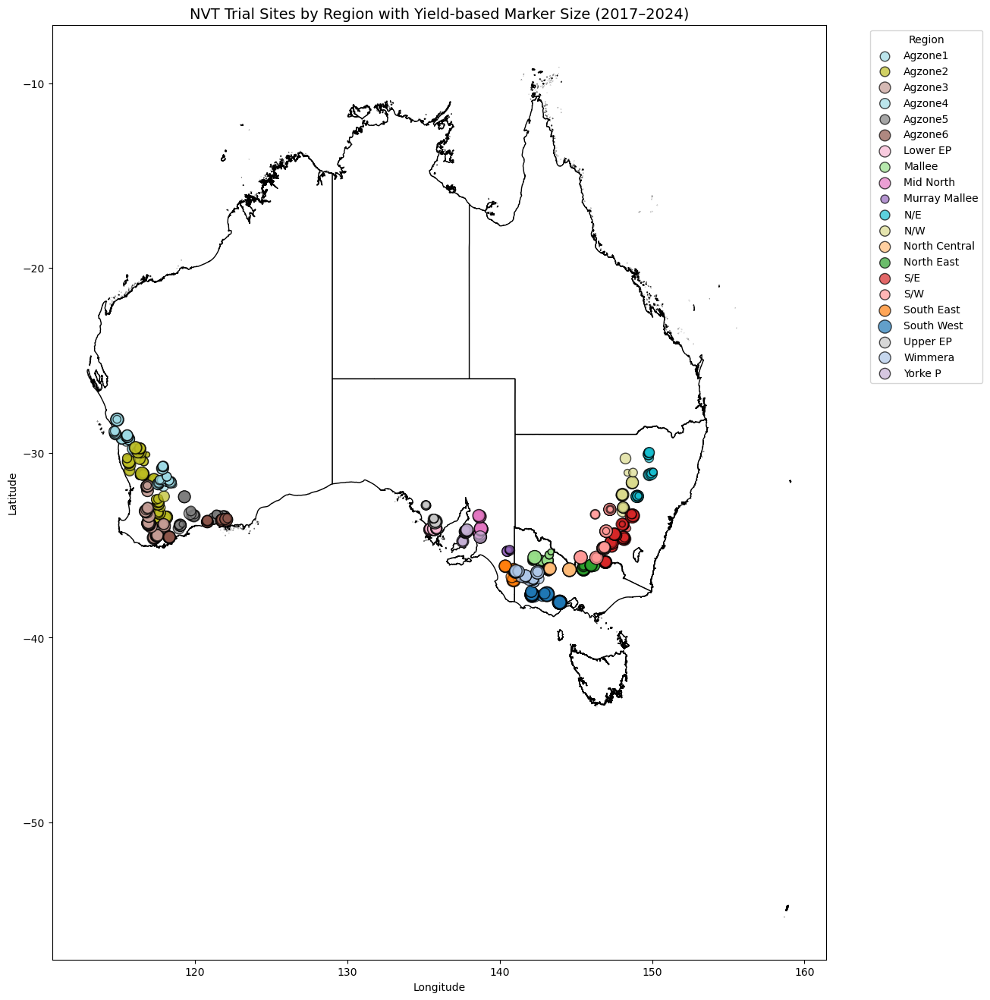

In [4]:
plot_experiments_across_australia(df)

In [5]:
def get_variety_counts_df(df: DataFrame)->DataFrame:
    varieties = df['VarietyDisplayName'].unique().tolist()
    variety_counts = {}
    for variety in varieties:
        variety_counts[variety] = df[df['VarietyDisplayName'] == variety].shape[0]
    sorted_variety_counts = dict(sorted(variety_counts.items(), key=lambda item: item[1], reverse=True))
    df_variety_counts = DataFrame(list(sorted_variety_counts.items()), columns=["item", "count"])
    return df_variety_counts

In [ ]:
from geopy.distance import geodesic
def is_isolated(idx, row, df, radius_km=4):
    """Check if a point has no neighbors within radius_km."""
    for j, other in df.drop(idx).iterrows():
        dist = geodesic((row["Trial GPS Lat"], row["Trial GPS Long"]), (other["Trial GPS Lat"], other["Trial GPS Long"])).km
        if dist < radius_km:
            return False
    return True

In [6]:
df_variety_counts = get_variety_counts_df(df)

In [7]:
df_variety_counts

,item,count
0,HyTTec Trophy,423
1,InVigor T 4510,392
2,ATR Bonito,376
3,Hyola Blazer TT,284
4,HyTTec Trident,283
...,...,...
120,Nuseed GT-41,13
121,Hyola 50,10
122,Hyola 525RT,5
123,Hyola 600RR,4


In [77]:
variety =  	'Hyola Blazer TT'

In [78]:
df_variety = df[df['VarietyDisplayName'] == variety]

In [79]:
df_variety[['Trial GPS Lat', 'Trial GPS Long']]

,Trial GPS Lat,Trial GPS Long
2889,-34.846620,147.349180
2997,-35.248840,146.779360
3286,-35.966720,142.822730
3681,-36.433396,142.485342
3740,-29.155222,115.359370
...,...,...
14484,-32.378283,119.296856
14515,-33.924578,119.029617
14546,-33.400973,119.925243
14582,-33.578755,121.990299


In [83]:
df_variety = df_variety[df_variety.apply(lambda r: is_isolated(r.name, r, df_variety, radius_km=4), axis=1)].reset_index(drop=True)

In [86]:
df_variety

,Year,Crop.Name,State,RegionName,SiteDescription,TrialCode,SeriesName,Orientation,Company.Name,Trial GPS Lat,...,Probability,Error Mean Squared,1000 grain weight,Protein - Seed (raw),Protein Meal (10% moisture),Glucosinolate,Grain Moisture Content,Oil - Seed (6% moisture),Oil (raw),Protein Seed (10% moisture)
0,2019,Canola,NSW,S/W,Lockhart,CHTA19LOCK2,Med-High Rainfall Triazine,Unspecified,NVT,-35.248840,...,<0.001,0.011656,NaN,31.48,48.142736,NaN,5.59,35.405571,35.56,30.009533
1,2019,Canola,VIC,Mallee,Birchip,CLTA19BIRC3,Low-Med Rainfall Triazine,West,NVT,-35.966720,...,<0.001,0.009705,NaN,25.40,43.377609,NaN,8.40,39.919214,38.90,24.956332
2,2019,Canola,VIC,Wimmera,Minyip,CHTA19MINY3,Med-High Rainfall Triazine,Unspecified,NVT,-36.433396,...,<0.001,0.007749,3.5,21.90,38.123791,NaN,5.70,42.464475,42.60,20.901379
3,2019,Canola,WA,Agzone1,Mingenew,CLTB19MING6,Low-Med Rainfall Triazine,Unspecified,NVT,-29.155222,...,<0.001,0.005742,NaN,27.40,48.447937,NaN,7.00,42.552688,42.10,26.516129
4,2019,Canola,WA,Agzone2,Tincurrin-N,CLTA19TI.N6,Low-Med Rainfall Triazine,Unspecified,NVT,-32.964707,...,<0.001,0.016262,NaN,28.80,44.922010,NaN,4.50,37.206283,37.80,27.141361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,2024,Canola,WA,Agzone4,Kellerberrin,CLTA24KELL6,Low-Med Rainfall Triazine,Unspecified,NVT,-31.647575,...,<0.001,0.013207,NaN,26.00,43.575418,NaN,6.00,40.300000,40.30,24.893617
105,2024,Canola,WA,Agzone5,Cascade,CHTA24CASC6,Med-High Rainfall Triazine,Unspecified,NVT,-33.545775,...,<0.001,0.027623,NaN,21.40,40.805084,NaN,7.80,45.878524,45.00,20.889370
106,2024,Canola,WA,Agzone5,Grass Patch,CHTA24GRAS6,Med-High Rainfall Triazine,Unspecified,NVT,-33.337632,...,<0.001,0.015023,NaN,27.30,46.800000,NaN,7.90,40.416938,39.60,26.677524
107,2024,Canola,WA,Agzone5,Mt. Madden,CLTA24MADD6,Low-Med Rainfall Triazine,Unspecified,NVT,-33.400973,...,<0.001,0.014329,NaN,20.20,38.113207,NaN,4.20,47.196242,48.10,18.977035


In [87]:
df_variety[df_variety['Year'] == 2022]

,Year,Crop.Name,State,RegionName,SiteDescription,TrialCode,SeriesName,Orientation,Company.Name,Trial GPS Lat,...,Probability,Error Mean Squared,1000 grain weight,Protein - Seed (raw),Protein Meal (10% moisture),Glucosinolate,Grain Moisture Content,Oil - Seed (6% moisture),Oil (raw),Protein Seed (10% moisture)
43,2022,Canola,NSW,N/E,Mullaley,CHTA22MULL2,Med-High Rainfall Triazine,Unspecified,NVT,-31.183210,...,<0.001,0.051511,NaN,25.70,46.260000,NaN,6.10,43.946751,43.90,24.632587
44,2022,Canola,NSW,S/W,Lockhart,CHTA22LOCK2,Med-High Rainfall Triazine,Unspecified,NVT,-35.163880,...,<0.001,0.087812,NaN,23.15,43.789407,NaN,4.60,47.118238,47.82,21.839622
45,2022,Canola,SA,Mid North,Riverton,CHTA22RIVE5,Med-High Rainfall Triazine,Unspecified,NVT,-34.097410,...,<0.001,0.030090,NaN,17.60,35.357142,NaN,4.60,49.857442,50.60,16.603773
46,2022,Canola,SA,South East,Frances,CHTA22FRAN5,Med-High Rainfall Triazine,Unspecified,NVT,-36.907840,...,<0.001,0.070742,4.18,27.40,51.268191,NaN,6.10,45.848775,45.80,26.261980
47,2022,Canola,SA,Yorke P,Arthurton,CHTA22ARTH5,Med-High Rainfall Triazine,Unspecified,NVT,-34.262076,...,<0.001,0.060082,NaN,21.60,39.950678,NaN,5.26,45.720075,46.08,20.519316
48,2022,Canola,VIC,North Central,Charlton,CHTA22CHAR3,Med-High Rainfall Triazine,North,NVT,-36.262391,...,<0.001,0.012879,NaN,16.90,33.725055,NaN,7.60,48.119047,47.30,16.461038
49,2022,Canola,WA,Agzone1,Mingenew,CLTA22MING6,Low-Med Rainfall Triazine,Unspecified,NVT,-29.163105,...,<0.001,0.010069,NaN,21.80,40.370370,NaN,5.40,45.708245,46.00,20.739957
50,2022,Canola,WA,Agzone2,Bolgart,CHTA22BOLG6,Med-High Rainfall Triazine,Unspecified,NVT,-31.120559,...,<0.001,0.015583,NaN,19.20,39.542334,NaN,6.00,50.300000,50.30,18.382978
51,2022,Canola,WA,Agzone2,Cunderdin,CHTA22CUND6,Med-High Rainfall Triazine,Unspecified,NVT,-31.439829,...,<0.001,0.019816,NaN,18.30,37.262443,NaN,6.60,49.516059,49.20,17.633832
52,2022,Canola,WA,Agzone2,Dalwallinu,CLTA22DALW6,Low-Med Rainfall Triazine,Unspecified,NVT,-30.303664,...,<0.001,0.037212,NaN,19.40,38.039215,NaN,6.90,47.656283,47.20,18.754027


In [85]:
df_variety_counts = get_variety_counts_df(df_variety)

In [91]:
df_variety[df_variety['Year'] == 2022]

,Year,Crop.Name,State,RegionName,SiteDescription,TrialCode,SeriesName,Orientation,Company.Name,Trial GPS Lat,...,Probability,Error Mean Squared,1000 grain weight,Protein - Seed (raw),Protein Meal (10% moisture),Glucosinolate,Grain Moisture Content,Oil - Seed (6% moisture),Oil (raw),Protein Seed (10% moisture)
43,2022,Canola,NSW,N/E,Mullaley,CHTA22MULL2,Med-High Rainfall Triazine,Unspecified,NVT,-31.183210,...,<0.001,0.051511,NaN,25.70,46.260000,NaN,6.10,43.946751,43.90,24.632587
44,2022,Canola,NSW,S/W,Lockhart,CHTA22LOCK2,Med-High Rainfall Triazine,Unspecified,NVT,-35.163880,...,<0.001,0.087812,NaN,23.15,43.789407,NaN,4.60,47.118238,47.82,21.839622
45,2022,Canola,SA,Mid North,Riverton,CHTA22RIVE5,Med-High Rainfall Triazine,Unspecified,NVT,-34.097410,...,<0.001,0.030090,NaN,17.60,35.357142,NaN,4.60,49.857442,50.60,16.603773
46,2022,Canola,SA,South East,Frances,CHTA22FRAN5,Med-High Rainfall Triazine,Unspecified,NVT,-36.907840,...,<0.001,0.070742,4.18,27.40,51.268191,NaN,6.10,45.848775,45.80,26.261980
47,2022,Canola,SA,Yorke P,Arthurton,CHTA22ARTH5,Med-High Rainfall Triazine,Unspecified,NVT,-34.262076,...,<0.001,0.060082,NaN,21.60,39.950678,NaN,5.26,45.720075,46.08,20.519316
48,2022,Canola,VIC,North Central,Charlton,CHTA22CHAR3,Med-High Rainfall Triazine,North,NVT,-36.262391,...,<0.001,0.012879,NaN,16.90,33.725055,NaN,7.60,48.119047,47.30,16.461038
49,2022,Canola,WA,Agzone1,Mingenew,CLTA22MING6,Low-Med Rainfall Triazine,Unspecified,NVT,-29.163105,...,<0.001,0.010069,NaN,21.80,40.370370,NaN,5.40,45.708245,46.00,20.739957
50,2022,Canola,WA,Agzone2,Bolgart,CHTA22BOLG6,Med-High Rainfall Triazine,Unspecified,NVT,-31.120559,...,<0.001,0.015583,NaN,19.20,39.542334,NaN,6.00,50.300000,50.30,18.382978
51,2022,Canola,WA,Agzone2,Cunderdin,CHTA22CUND6,Med-High Rainfall Triazine,Unspecified,NVT,-31.439829,...,<0.001,0.019816,NaN,18.30,37.262443,NaN,6.60,49.516059,49.20,17.633832
52,2022,Canola,WA,Agzone2,Dalwallinu,CLTA22DALW6,Low-Med Rainfall Triazine,Unspecified,NVT,-30.303664,...,<0.001,0.037212,NaN,19.40,38.039215,NaN,6.90,47.656283,47.20,18.754027


In [92]:
loc = 43
row = df_variety.loc[loc]

In [93]:
row

Year                                                 2022
Crop.Name                                          Canola
State                                                 NSW
RegionName                                            N/E
SiteDescription                                  Mullaley
TrialCode                                     CHTA22MULL2
SeriesName                     Med-High Rainfall Triazine
Orientation                                   Unspecified
Company.Name                                          NVT
Trial GPS Lat                                   -31.18321
Trial GPS Long                                  149.81272
SowingDate                            2022-05-25 00:00:00
HarvestDate                           2022-12-21 00:00:00
Released                                                1
Abandoned                                           False
METInclude                                           True
StatusID                                                1
VarietyDisplay

In [94]:
query = Query(
    lat=row['Trial GPS Lat'],
    lon=row['Trial GPS Long'],
    collections=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],
    buffer=0.01,
    bands=[
        'nbart_blue',
        'nbart_green',
        'nbart_red',
        'nbart_red_edge_1',
        'nbart_red_edge_2',
        'nbart_red_edge_3',
        'nbart_nir_1',
        'nbart_nir_2',
        'nbart_swir_2',
        'nbart_swir_3'
    ],
    start_time=row['SowingDate'].date(),
    end_time=row['HarvestDate'].date(),
    out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim',
    tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim',
    stub=f"Canola-{variety}-{loc}"
)

In [95]:
from PaddockTS.PaddockSegmentation.get_paddocks import get_paddocks
get_paddocks(query, device='cuda')

/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/ds2.pkl Canola-Hyola Blazer TT-43


/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39333 instead
  warnings.warn(
/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/preseg.tif ----------


100%|██████████| 1/1 [00:02<00:00,  2.79s/it]
INFO:pyogrio._io:Created 102 records
INFO:pyogrio._io:Created 9 records


In [96]:
from PaddockTS.IndicesAndVegFrac.add_indices_and_veg_frac import add_indices_and_veg_frac 

In [97]:
add_indices_and_veg_frac(query)

SHape of input (should be time, bands, x, y): (28, 6, 220, 194)
Not applying correction factors


/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


NDVI has shape: (28, 220, 194)
CFI has shape: (28, 220, 194)
NIRv has shape: (28, 220, 194)


/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/DS2I.pkl
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/checkpoints/Canola-Hyola Blazer TT-43_thumbs_rgb.png
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/checkpoints/Canola-Hyola Blazer TT-43_thumbs_vegfrac.png


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.804123711340207 to 6.0 x 6.8
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x680 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y '/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/checkpoints/Canola-Hyola Blazer TT-43_manpad_RGB.mp4'
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.804123711340207 to 6.0 x 6.8
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x680 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y '/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/Canola-Hyola Blazer TT-43/checkpoints/Canola-H

Normalizing all frames by reference max = 0.802


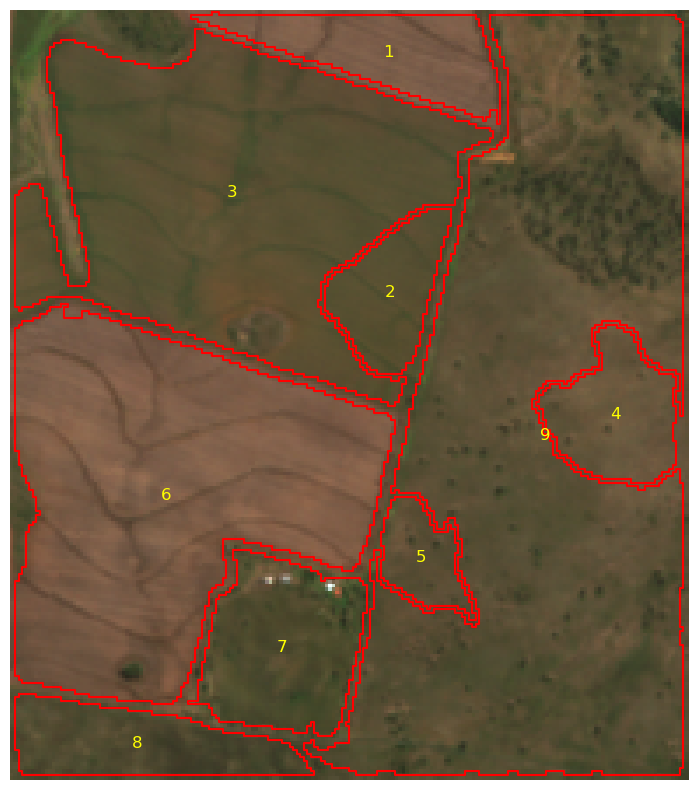

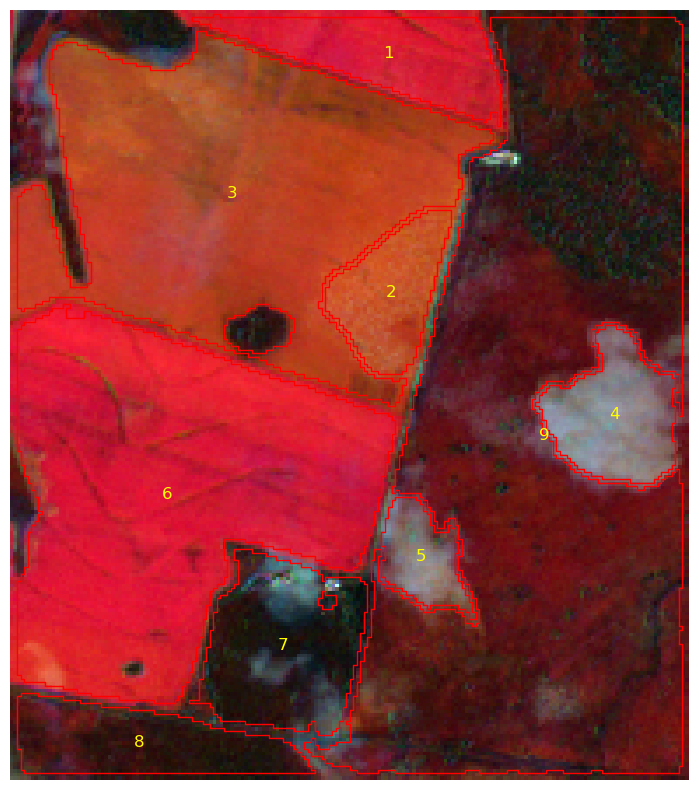

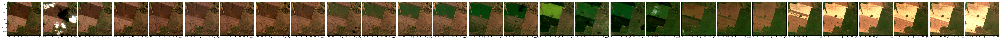

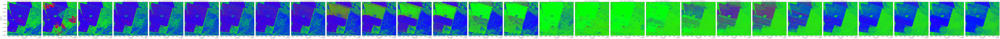

In [98]:
plot(query)

In [99]:
from shapely.geometry import Point

In [100]:
polygons = gpd.read_file(query.path_polygons).to_crs('EPSG:4326')

In [101]:
point = Point(query.lon, query.lat)

In [102]:
polygons['geometry'].contains(point)

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
dtype: bool

EPSG:4326


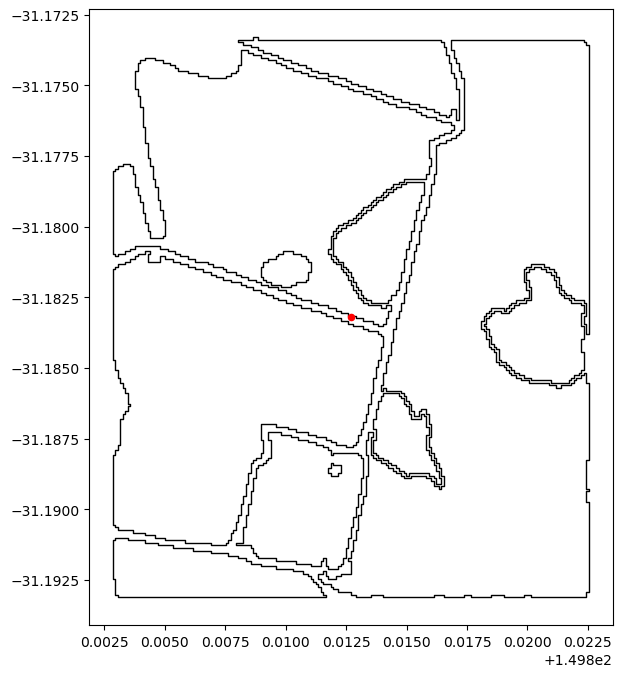

In [103]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Example: polygons already have CRS (e.g., EPSG:3857)
print(polygons.crs)

# Create GeoSeries for your query point (assume it's lon/lat WGS84)
pt = gpd.GeoSeries([Point(query.lon, query.lat)], crs="EPSG:4326")

# Reproject point to match polygons
pt = pt.to_crs(polygons.crs)

# Plot polygons and point
ax = polygons.plot(edgecolor="black", facecolor="none", figsize=(8, 8))
pt.plot(ax=ax, color="red", markersize=20)

plt.show()